<a href="https://colab.research.google.com/github/AbigailMRod/GANsDL.AI/blob/main/Pix2Pix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Pix2Pix

En este cuaderno, se escribirá un modelo generativo basado en el artículo [*Image-to-Image Translation with Conditional Adversarial Networks*](https://arxiv.org/abs/1611.07004) de Isola et al. 2017, también conocido como Pix2Pix.

Entrenará un modelo que puede convertir imágenes satelitales aéreas ("entrada") en rutas de mapa ("salida"), como se hizo en el documento original. Dado que la arquitectura del generador es una U-Net, que ya ha implementado (con cambios menores), el énfasis de la asignación estará en la función de pérdida. Para que pueda ver los resultados más rápidamente, podrá ver cómo su modelo se entrena a partir de un punto de control previamente entrenado, pero siéntase libre de entrenarlo desde cero también.
<img src="https://blog.paperspace.com/content/images/2022/04/image-14.png">


## Empezando
Comenzará importando bibliotecas, definiendo una función de visualización y obteniendo el punto de control Pix2Pix pre-entrenado. También se le proporcionará el código U-Net para el generador Pix2Pix.

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Función de visualización de imágenes: Dado un tensor de imágenes, número de imágenes y
     tamaño por imagen, traza e imprime las imágenes en una cuadrícula uniforme.
    '''
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### Código U-Net

La estructura se cambia ligeramente para Pix2Pix, de modo que la imagen final tiene un tamaño más cercano a la imagen de entrada. ¡Siéntase libre de investigar el código si está interesado!

In [2]:
def crop(image, new_shape):
    '''
    Función para recortar un tensor de imagen: dado un tensor de imagen y la nueva forma,
     recortes a los píxeles del centro.
     Parámetros:
         image: imagen tensor de forma (tamaño de lote, canales, altura, ancho)
         new_shape: un objeto torch.Size con la forma que quieres que tenga x
    '''
    middle_height = image.shape[2] // 2
    middle_width = image.shape[3] // 2
    starting_height = middle_height - round(new_shape[2] / 2)
    final_height = starting_height + new_shape[2]
    starting_width = middle_width - round(new_shape[3] / 2)
    final_width = starting_width + new_shape[3]
    cropped_image = image[:, :, starting_height:final_height, starting_width:final_width]
    return cropped_image

class ContractingBlock(nn.Module):
    '''
    Clase ContractingBlockContractingBlock 
     Realiza dos convoluciones seguidas de una operación de agrupación máxima.
     Valores:
         input_channels: el número de canales que se esperan de una entrada dada
    '''
    def __init__(self, input_channels, use_dropout=False, use_bn=True):
        super(ContractingBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels * 2, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(input_channels * 2, input_channels * 2, kernel_size=3, padding=1)
        self.activation = nn.LeakyReLU(0.2)
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        if use_bn:
            self.batchnorm = nn.BatchNorm2d(input_channels * 2)
        self.use_bn = use_bn
        if use_dropout:
            self.dropout = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x):
        '''
        Función para completar un pase hacia adelante de ContractingBlock:
         Dado un tensor de imagen, completa un bloque de contratación y devuelve el tensor transformado.
         Parámetros:
             x: tensor de imagen de forma (tamaño de lote, canales, altura, ancho)
        '''
        x = self.conv1(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.conv2(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.maxpool(x)
        return x

class ExpandingBlock(nn.Module):
    '''
    Clase ExpandingBlock:
     Realiza un sobremuestreo, una convolución, una concatenación de sus dos entradas,
     seguido de dos circunvoluciones más con abandono opcional
     Valores:
         input_channels: el número de canales que se esperan de una entrada dada
    '''
    def __init__(self, input_channels, use_dropout=False, use_bn=True):
        super(ExpandingBlock, self).__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv1 = nn.Conv2d(input_channels, input_channels // 2, kernel_size=2)
        self.conv2 = nn.Conv2d(input_channels, input_channels // 2, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(input_channels // 2, input_channels // 2, kernel_size=2, padding=1)
        if use_bn:
            self.batchnorm = nn.BatchNorm2d(input_channels // 2)
        self.use_bn = use_bn
        self.activation = nn.ReLU()
        if use_dropout:
            self.dropout = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x, skip_con_x):
        '''
        Función para completar un pase hacia adelante de ExpandingBlock:
         Dado un tensor de imagen, completa un bloque de expansión y devuelve el tensor transformado.
         Parámetros:
             x: tensor de imagen de forma (tamaño de lote, canales, altura, ancho)
             skip_con_x: el tensor de imagen del camino de contracción (del bloque opuesto de x)
                     para la conexión de salto
        '''
        x = self.upsample(x)
        x = self.conv1(x)
        skip_con_x = crop(skip_con_x, x.shape)
        x = torch.cat([x, skip_con_x], axis=1)
        x = self.conv2(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.conv3(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        return x

class FeatureMapBlock(nn.Module):
    '''
    Clase FeatureMapBlock
     La capa final de una U-Net -
     asigna cada píxel a un píxel con el número correcto de dimensiones de salida
     usando una convolución 1x1.
     Valores:
         input_channels: el número de canales que se esperan de una entrada dada
         output_channels: el número de canales a esperar para una salida dada
    '''
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=1)

    def forward(self, x):
        '''
        Función para completar un pase hacia adelante de FeatureMapBlock:
         Dado un tensor de imagen, lo devuelve mapeado al número de canales deseado.
         Parámetros:
             x: tensor de imagen de forma (tamaño de lote, canales, altura, ancho)
        '''
        x = self.conv(x)
        return x

class UNet(nn.Module):
    '''
    Clase UNet
     Una serie de 4 bloques de contracción seguidos de 4 bloques de expansión para
     transformar una imagen de entrada en la imagen emparejada correspondiente, con una característica mejorada
     capa al principio y una capa downfeature al final.
     Valores:
         input_channels: el número de canales que se esperan de una entrada dada
         output_channels: el número de canales a esperar para una salida dada
    '''
    def __init__(self, input_channels, output_channels, hidden_channels=32):
        super(UNet, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_dropout=True)
        self.contract2 = ContractingBlock(hidden_channels * 2, use_dropout=True)
        self.contract3 = ContractingBlock(hidden_channels * 4, use_dropout=True)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        self.contract5 = ContractingBlock(hidden_channels * 16)
        self.contract6 = ContractingBlock(hidden_channels * 32)
        self.expand0 = ExpandingBlock(hidden_channels * 64)
        self.expand1 = ExpandingBlock(hidden_channels * 32)
        self.expand2 = ExpandingBlock(hidden_channels * 16)
        self.expand3 = ExpandingBlock(hidden_channels * 8)
        self.expand4 = ExpandingBlock(hidden_channels * 4)
        self.expand5 = ExpandingBlock(hidden_channels * 2)
        self.downfeature = FeatureMapBlock(hidden_channels, output_channels)
        self.sigmoid = torch.nn.Sigmoid()

    def forward(self, x):
        '''
        Función para completar un pase hacia adelante de UNet:
         Dado un tensor de imagen, lo pasa a través de U-Net y devuelve la salida.
         Parámetros:
             x: tensor de imagen de forma (tamaño de lote, canales, altura, ancho)
        '''
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        x5 = self.contract5(x4)
        x6 = self.contract6(x5)
        x7 = self.expand0(x6, x5)
        x8 = self.expand1(x7, x4)
        x9 = self.expand2(x8, x3)
        x10 = self.expand3(x9, x2)
        x11 = self.expand4(x10, x1)
        x12 = self.expand5(x11, x0)
        xn = self.downfeature(x12)
        return self.sigmoid(xn)

## Discriminador PatchGAN

A continuación, definirá un discriminador basado en la ruta de contracción de U-Net para permitirle evaluar el realismo de las imágenes generadas. Recuerde que el discriminador genera una matriz de clasificaciones de un canal en lugar de un valor único. La capa final de su discriminador simplemente mapeará desde el número final de canales ocultos a una sola predicción para cada píxel de la capa anterior.

In [3]:
class Discriminator(nn.Module):
    '''
    Clase de discriminador
     Estructurado como el camino de contracción de la U-Net, el discriminador
     genera una matriz de valores que clasifica las partes correspondientes de la imagen como reales o falsas.
     Parámetros:
         input_channels: el número de canales de entrada de imagen
         hidden_channels: el número inicial de filtros convolucionales discriminadores
    '''
    def __init__(self, input_channels, hidden_channels=8):
        super(Discriminator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_bn=False)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        self.contract3 = ContractingBlock(hidden_channels * 4)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        #### START CODE HERE ####
        self.final = nn.Conv2d(hidden_channels * 16, 1, kernel_size=1)
        #### END CODE HERE ####

    def forward(self, x, y):
        x = torch.cat([x, y], axis=1)
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        xn = self.final(x4)
        return xn

In [4]:
# UNIT TEST
test_discriminator = Discriminator(10, 1)
assert tuple(test_discriminator(
    torch.randn(1, 5, 256, 256), 
    torch.randn(1, 5, 256, 256)
).shape) == (1, 1, 16, 16)
print("Success!")

Success!


## Preparación de entrenamiento
<!-- Usarás la misma U-Net que en la tarea anterior, pero escribirás otro discriminador y cambiarás la pérdida para que sea una GAN. -->

Ahora puede comenzar a armar todo para el entrenamiento. Empiece definiendo algunos parámetros nuevos, además de aquellos con los que está familiarizado:
  * **real_dim**: el número de canales de la imagen real y el número esperado en la imagen de salida
  * **adv_criterion**: una función de pérdida contradictoria para realizar un seguimiento de qué tan bien la GAN está engañando al discriminador y qué tan bien el discriminador está atrapando la GAN
  * **recon_criterion**: una función de pérdida que recompensa imágenes similares a la verdad básica, que "reconstruyen" la imagen
  * **lambda_recon**: un parámetro de cuánto se debe sopesar la pérdida de reconstrucción
  * **n_epochs**: la cantidad de veces que itera a través de todo el conjunto de datos durante el entrenamiento
  * **input_dim**: el número de canales de la imagen de entrada
  * **display_step**: con qué frecuencia mostrar/visualizar las imágenes
  * **batch_size**: el número de imágenes por paso adelante/atrás
  * **lr**: la tasa de aprendizaje
  * **target_shape**: el tamaño de la imagen de salida (en píxeles)
  * **dispositivo**: el tipo de dispositivo

In [5]:
import torch.nn.functional as F
# New parameters
adv_criterion = nn.BCEWithLogitsLoss() 
recon_criterion = nn.L1Loss() 
lambda_recon = 200

n_epochs = 20
input_dim = 3
real_dim = 3
display_step = 200
batch_size = 4
lr = 0.0002
target_shape = 256
device = 'cuda'

Luego, preprocesará las imágenes del conjunto de datos para asegurarse de que todas tengan el mismo tamaño y que se tenga en cuenta el cambio de tamaño debido a las capas de U-Net.

In [10]:
!git clone https://github.com/AbigailMRod/GANsDL.AI.git

Cloning into 'GANsDL.AI'...
remote: Enumerating objects: 2280, done.
remote: Counting objects: 100% (80/80), done.
remote: Compressing objects: 100% (60/60), done.
remote: Total 2280 (delta 20), reused 77 (delta 18), pack-reused 2200
Receiving objects: 100% (2280/2280), 340.52 MiB | 17.01 MiB/s, done.
Resolving deltas: 100% (21/21), done.
Checking out files: 100% (2220/2220), done.


In [15]:
%cd /content/GANsDL.AI
!git pull

/content/GANsDL.AI
Already up to date.


In [11]:
transform = transforms.Compose([
    transforms.ToTensor(),
])

import torchvision
dataset = torchvision.datasets.ImageFolder("/content/GANsDL.AI/maps", transform=transform)

A continuación, puede inicializar su generador (U-Net) y discriminador, así como sus optimizadores. Finalmente, también cargará su modelo pre-entrenado.

In [19]:
# gen = UNet(input_dim, real_dim).to(device)
# gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
# disc = Discriminator(input_dim + real_dim).to(device)
# disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

# def weights_init(m):
#     if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
#         torch.nn.init.normal_(m.weight, 0.0, 0.02)
#     if isinstance(m, nn.BatchNorm2d):
#         torch.nn.init.normal_(m.weight, 0.0, 0.02)
#         torch.nn.init.constant_(m.bias, 0)

# # Siéntase libre de cambiar preentrenado a Falso si está entrenando el modelo desde cero
# pretrained = True
# if pretrained:
#     loaded_state = torch.load("pix2pix_15000.pth")
#     gen.load_state_dict(loaded_state["gen"])
#     gen_opt.load_state_dict(loaded_state["gen_opt"])
#     disc.load_state_dict(loaded_state["disc"])
#     disc_opt.load_state_dict(loaded_state["disc_opt"])
# else:
#     gen = gen.apply(weights_init)
#     disc = disc.apply(weights_init)

Si bien hay algunos cambios en la arquitectura U-Net para Pix2Pix, la característica distintiva más importante de Pix2Pix es su pérdida adversaria. ¡Lo estarás implementando aquí!

In [16]:
def get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon):
    '''
    Devuelve la pérdida del generador dadas las entradas.
     Parámetros:
         gen: el generador; toma la condición y devuelve imágenes potenciales
         disc: el discriminador; toma imágenes y la condición y
           devuelve matrices de predicción real/falsa
         real: las imágenes reales (por ejemplo, mapas) que se utilizarán para evaluar la reconstrucción
         condition: las imágenes de origen (por ejemplo, imágenes de satélite) que se utilizan para producir las imágenes reales
         adv_criterion: la función de pérdida contradictoria; toma el discriminador
                   predicciones y las etiquetas verdaderas y devuelve un adversario
                   pérdida (que pretende minimizar)
         recon_criterion: la función de pérdida de reconstrucción; toma el generador
                     salidas y las imágenes reales y devuelve una reconstrucción
                     pérdida (que pretende minimizar)
         lambda_recon: el grado en que la pérdida de reconstrucción debe ponderarse en la suma
    '''
     # Pasos: 1) Generar las imágenes falsas, según las condiciones.
     # 2) Evaluar las imágenes falsas y la condición con el discriminador.
     # 3) Calcular las pérdidas adversarias y de reconstrucción.
     # 4) Sume las dos pérdidas, ponderando adecuadamente la pérdida por reconstrucción.
    #### START CODE HERE ####
    fake = gen(condition)
    disc_fake_hat = disc(fake, condition)
    gen_adv_loss = adv_criterion(disc_fake_hat, torch.ones_like(disc_fake_hat))
    gen_rec_loss = recon_criterion(real, fake)
    gen_loss = gen_adv_loss + lambda_recon * gen_rec_loss
    #### END CODE HERE ####
    return gen_loss

In [17]:
# UNIT TEST
def test_gen_reasonable(num_images=10):
    gen = torch.zeros_like
    disc = lambda x, y: torch.ones(len(x), 1)
    real = None
    condition = torch.ones(num_images, 3, 10, 10)
    adv_criterion = torch.mul
    recon_criterion = lambda x, y: torch.tensor(0)
    lambda_recon = 0
    assert get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon).sum() == num_images

    disc = lambda x, y: torch.zeros(len(x), 1)
    assert torch.abs(get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon)).sum() == 0

    adv_criterion = lambda x, y: torch.tensor(0)
    recon_criterion = lambda x, y: torch.abs(x - y).max()
    real = torch.randn(num_images, 3, 10, 10)
    lambda_recon = 2
    gen = lambda x: real + 1
    assert torch.abs(get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon) - 2) < 1e-4

    adv_criterion = lambda x, y: (x + y).max() + x.max()
    assert torch.abs(get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon) - 3) < 1e-4
test_gen_reasonable()
print("Success!")

Success!


## Entrenamiento Pix2Pix

¡Finalmente, puedes entrenar al modelo y ver algunos de tus mapas!

  0%|          | 0/549 [00:00<?, ?it/s]

Pretrained initial state


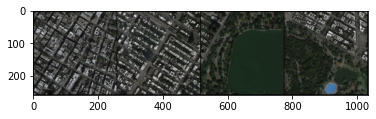

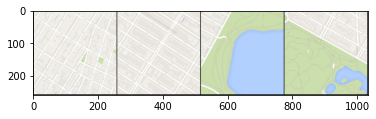

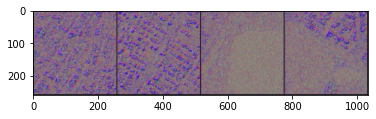

Epoch 0: Step 200: Generator (U-Net) loss: 60.81495609283442, Discriminator loss: 0.1592122306488455


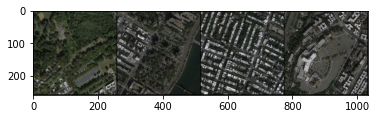

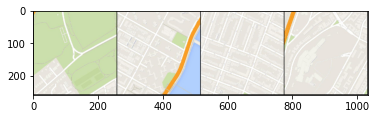

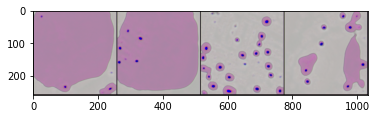

Epoch 0: Step 400: Generator (U-Net) loss: 37.557881755828845, Discriminator loss: 0.031101217451505365


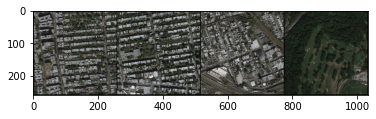

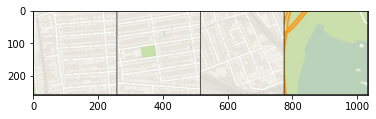

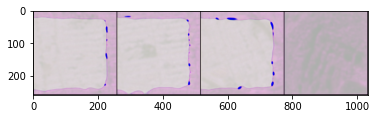

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 1: Step 600: Generator (U-Net) loss: 19.069671864509576, Discriminator loss: 0.2615812186663971


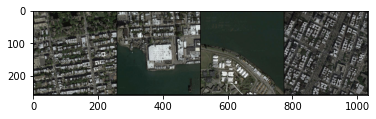

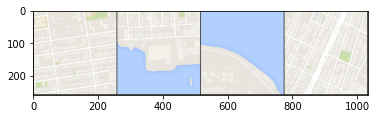

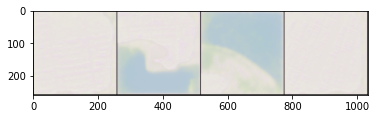

Epoch 1: Step 800: Generator (U-Net) loss: 13.786211915016175, Discriminator loss: 0.25427198961377145


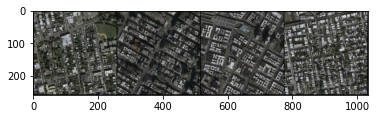

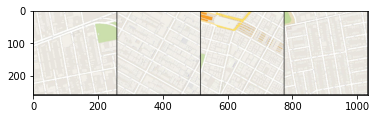

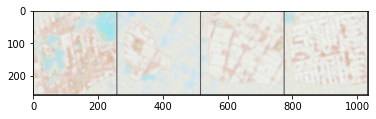

Epoch 1: Step 1000: Generator (U-Net) loss: 13.012933025360114, Discriminator loss: 0.3481338389217852


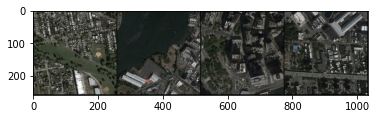

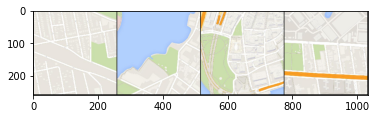

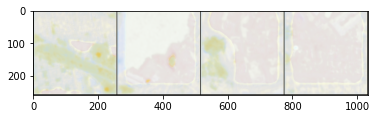

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 2: Step 1200: Generator (U-Net) loss: 12.86314159870148, Discriminator loss: 0.3116923580132427


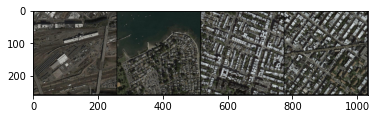

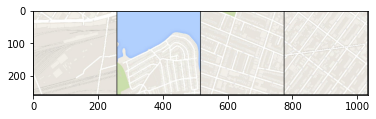

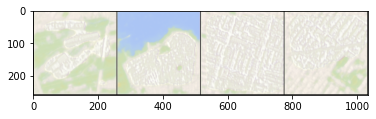

Epoch 2: Step 1400: Generator (U-Net) loss: 12.558054862022395, Discriminator loss: 0.31055203611031157


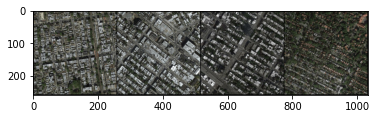

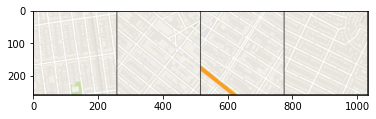

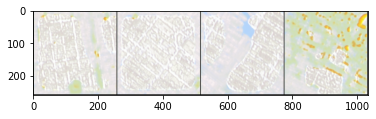

Epoch 2: Step 1600: Generator (U-Net) loss: 12.146614770889284, Discriminator loss: 0.2827273004502057


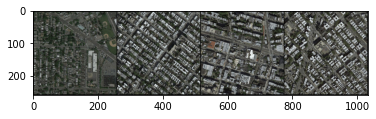

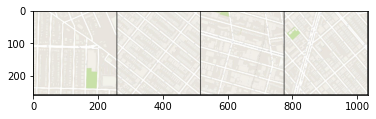

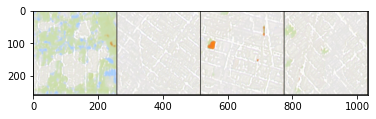

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 3: Step 1800: Generator (U-Net) loss: 12.03528292179107, Discriminator loss: 0.2781603272631764


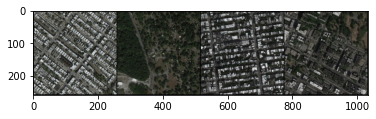

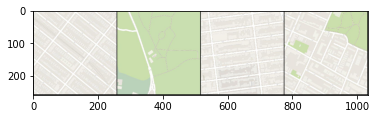

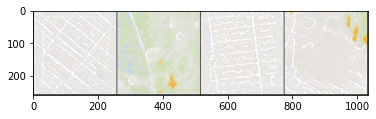

Epoch 3: Step 2000: Generator (U-Net) loss: 11.830653102397914, Discriminator loss: 0.2602266712859273


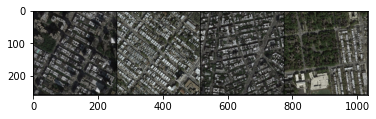

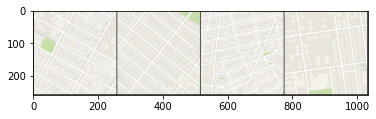

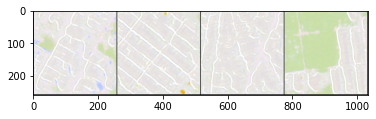

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 4: Step 2200: Generator (U-Net) loss: 11.493166375160218, Discriminator loss: 0.3257405376806857


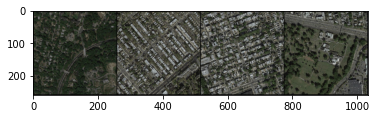

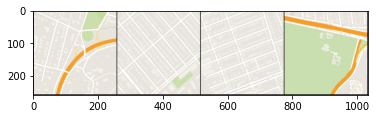

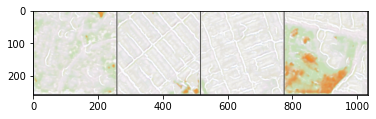

Epoch 4: Step 2400: Generator (U-Net) loss: 11.559481630325312, Discriminator loss: 0.361510397195816


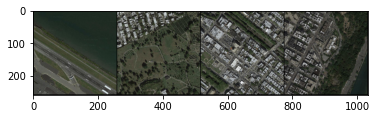

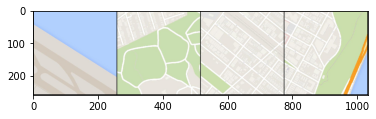

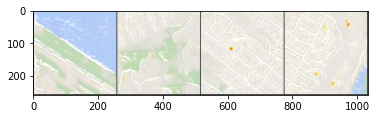

Epoch 4: Step 2600: Generator (U-Net) loss: 11.255788791179652, Discriminator loss: 0.3682236966118218


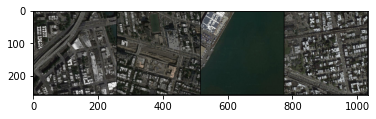

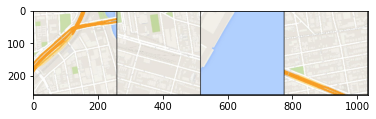

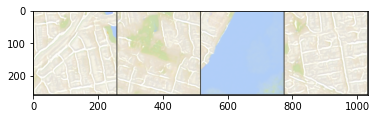

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 5: Step 2800: Generator (U-Net) loss: 10.575610756874083, Discriminator loss: 0.39200098536908595


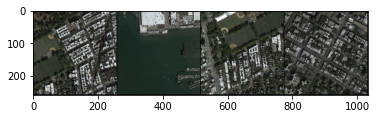

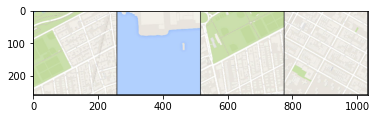

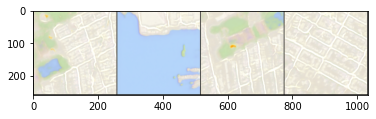

Epoch 5: Step 3000: Generator (U-Net) loss: 10.415400626659395, Discriminator loss: 0.38196498662233364


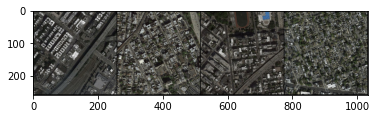

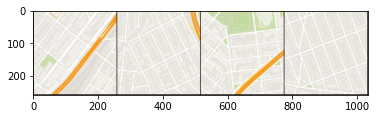

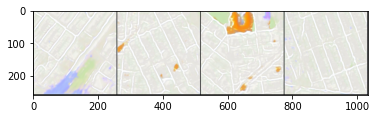

Epoch 5: Step 3200: Generator (U-Net) loss: 10.70016892194748, Discriminator loss: 0.3771440189331769


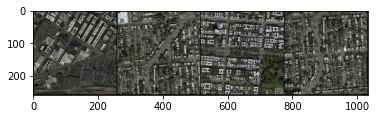

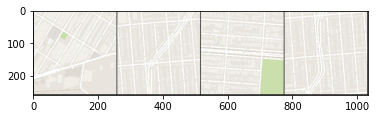

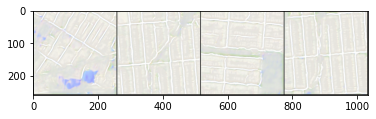

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 6: Step 3400: Generator (U-Net) loss: 10.616783256530757, Discriminator loss: 0.36528185520321127


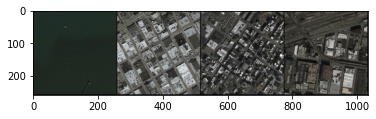

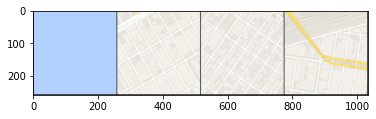

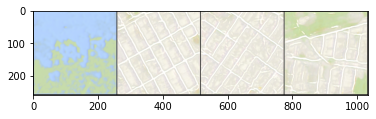

Epoch 6: Step 3600: Generator (U-Net) loss: 10.813222858905796, Discriminator loss: 0.3355561984609812


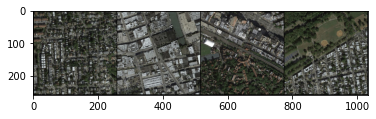

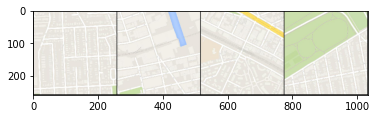

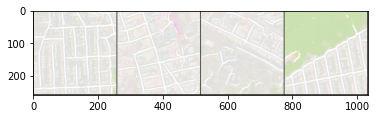

Epoch 6: Step 3800: Generator (U-Net) loss: 10.672215714454646, Discriminator loss: 0.344418142512441


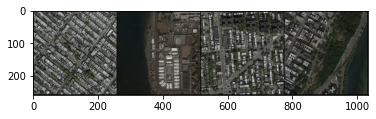

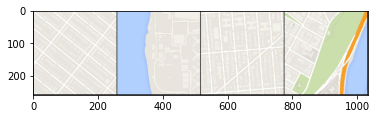

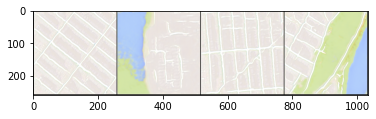

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 7: Step 4000: Generator (U-Net) loss: 11.459347200393681, Discriminator loss: 0.3344609227217735


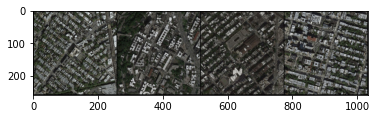

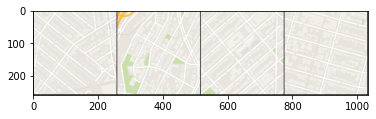

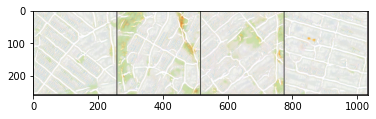

Epoch 7: Step 4200: Generator (U-Net) loss: 10.651140480041494, Discriminator loss: 0.35534446222707633


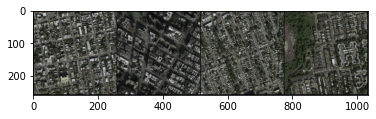

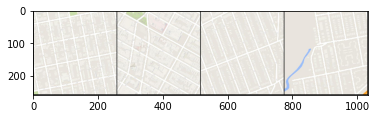

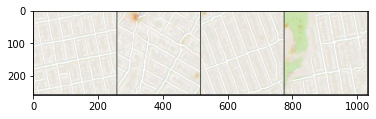

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 8: Step 4400: Generator (U-Net) loss: 10.351823489665978, Discriminator loss: 0.40723979922011494


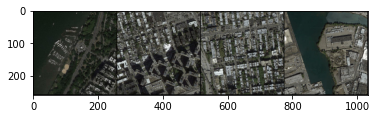

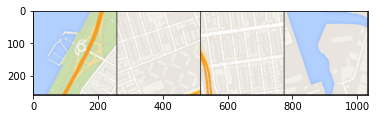

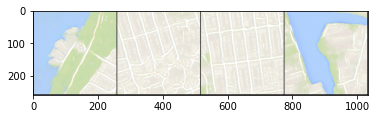

Epoch 8: Step 4600: Generator (U-Net) loss: 10.330114459991451, Discriminator loss: 0.3900931670889259


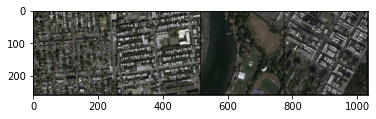

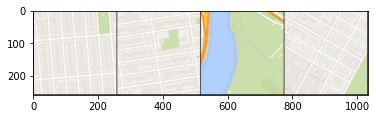

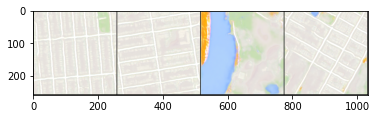

Epoch 8: Step 4800: Generator (U-Net) loss: 10.63779659748077, Discriminator loss: 0.3430630741454661


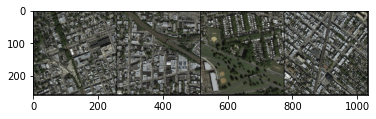

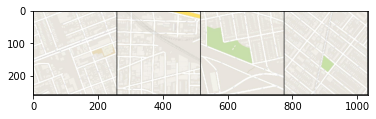

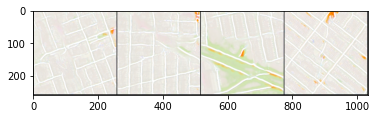

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 9: Step 5000: Generator (U-Net) loss: 10.477103552818305, Discriminator loss: 0.3894492880627512


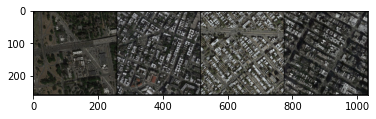

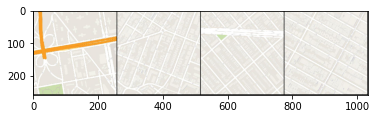

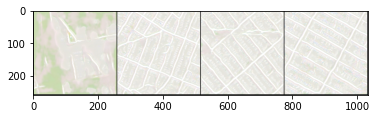

Epoch 9: Step 5200: Generator (U-Net) loss: 10.475534675121306, Discriminator loss: 0.36158596644178026


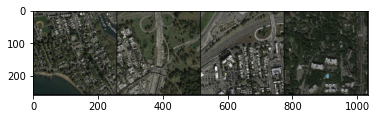

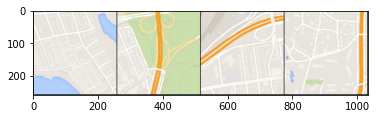

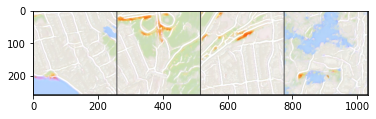

Epoch 9: Step 5400: Generator (U-Net) loss: 10.411083605289459, Discriminator loss: 0.38860783327370874


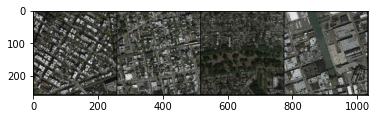

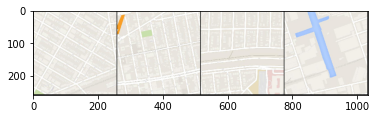

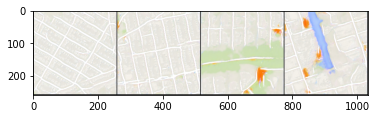

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 10: Step 5600: Generator (U-Net) loss: 10.57974770784378, Discriminator loss: 0.36762184558436295


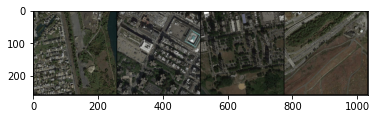

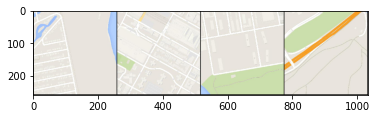

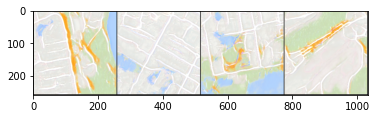

Epoch 10: Step 5800: Generator (U-Net) loss: 9.897991909980774, Discriminator loss: 0.40461485322564833


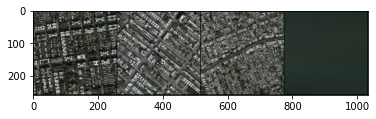

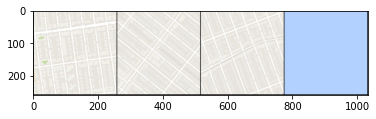

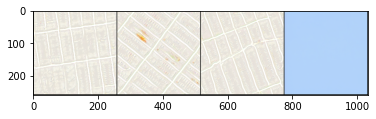

Epoch 10: Step 6000: Generator (U-Net) loss: 10.531407134532927, Discriminator loss: 0.3572639320604501


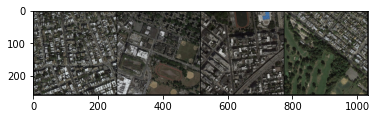

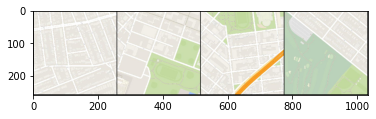

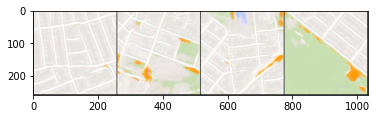

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 11: Step 6200: Generator (U-Net) loss: 10.264977295398717, Discriminator loss: 0.3218674291111531


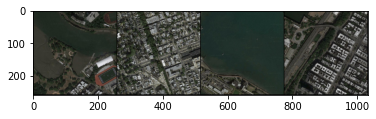

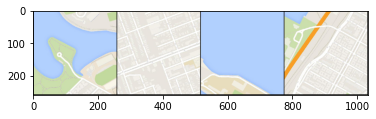

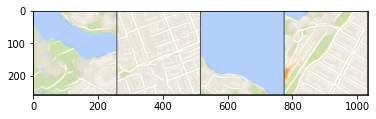

Epoch 11: Step 6400: Generator (U-Net) loss: 9.994552652835843, Discriminator loss: 0.35824796430766565


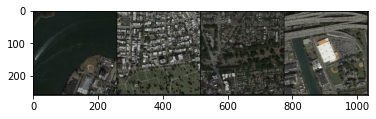

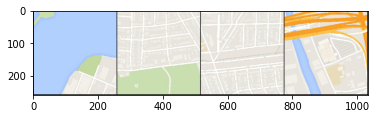

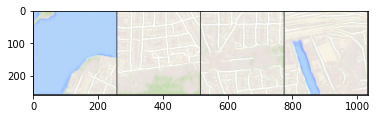

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 12: Step 6600: Generator (U-Net) loss: 10.378154625892645, Discriminator loss: 0.37911016512662193


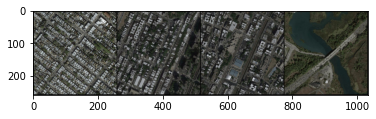

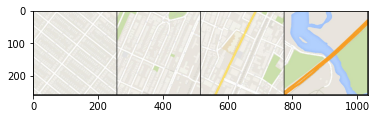

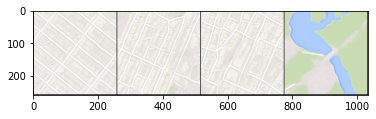

Epoch 12: Step 6800: Generator (U-Net) loss: 10.231575481891626, Discriminator loss: 0.3706897167675196


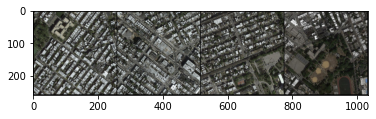

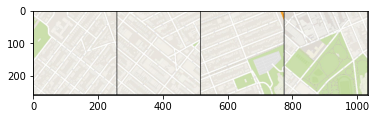

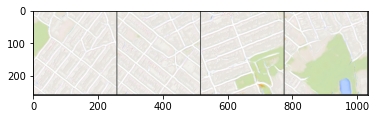

Epoch 12: Step 7000: Generator (U-Net) loss: 10.247553622722629, Discriminator loss: 0.39880254759453193


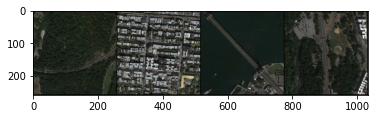

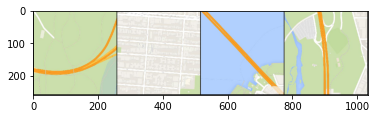

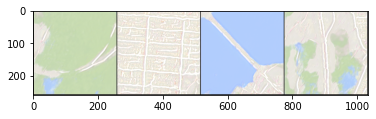

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 13: Step 7200: Generator (U-Net) loss: 10.038279366493226, Discriminator loss: 0.37575448201969264


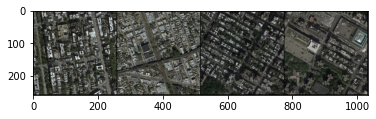

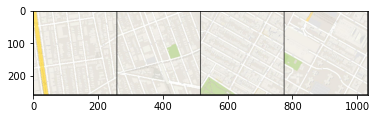

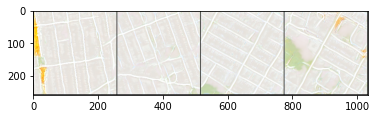

Epoch 13: Step 7400: Generator (U-Net) loss: 9.783196794986727, Discriminator loss: 0.3713005286455152


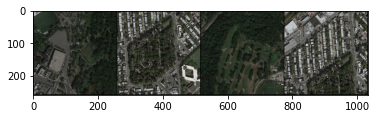

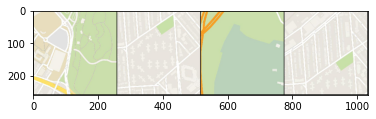

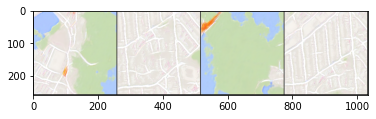

Epoch 13: Step 7600: Generator (U-Net) loss: 9.912470459938056, Discriminator loss: 0.3630854314006864


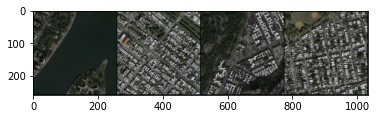

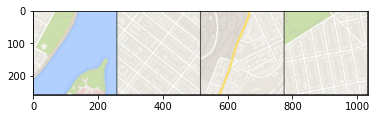

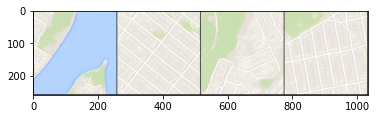

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 14: Step 7800: Generator (U-Net) loss: 9.88286957740784, Discriminator loss: 0.37131147885695087


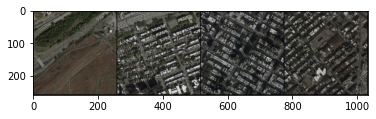

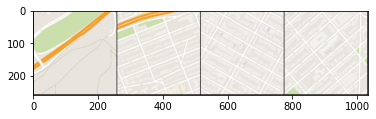

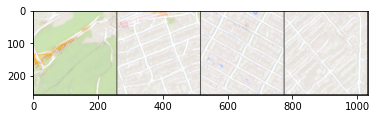

Epoch 14: Step 8000: Generator (U-Net) loss: 10.005167508125306, Discriminator loss: 0.35313835313543684


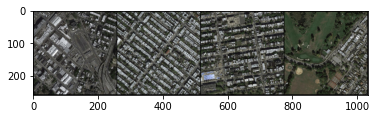

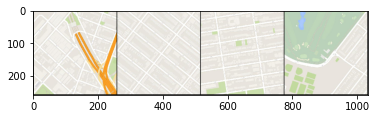

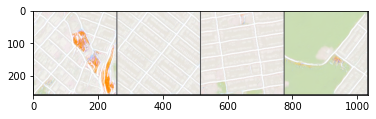

Epoch 14: Step 8200: Generator (U-Net) loss: 9.708075261116027, Discriminator loss: 0.3679608755744996


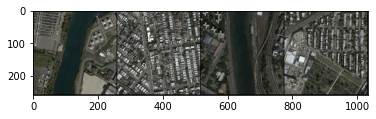

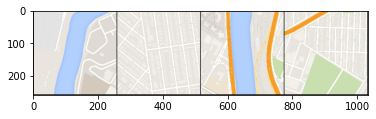

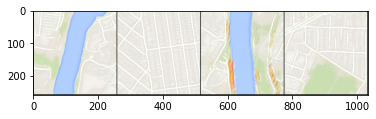

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 15: Step 8400: Generator (U-Net) loss: 9.748635807037353, Discriminator loss: 0.3669151886738838


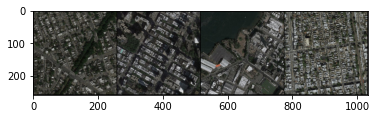

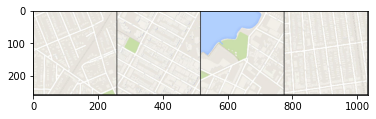

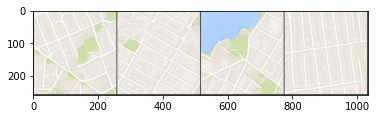

Epoch 15: Step 8600: Generator (U-Net) loss: 9.892450723648075, Discriminator loss: 0.35717168021947143


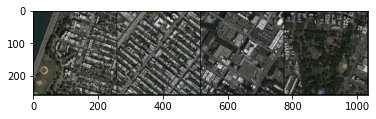

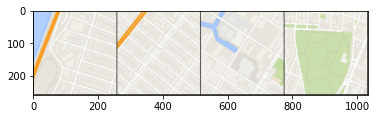

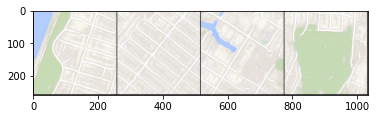

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 16: Step 8800: Generator (U-Net) loss: 9.503853139877323, Discriminator loss: 0.37945552581921216


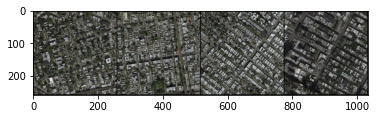

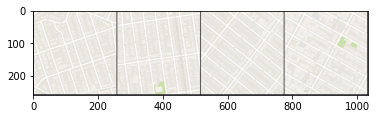

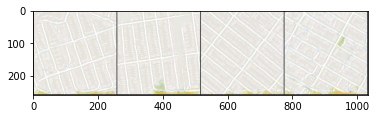

Epoch 16: Step 9000: Generator (U-Net) loss: 9.86094034433365, Discriminator loss: 0.3544573637843132


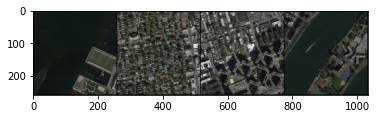

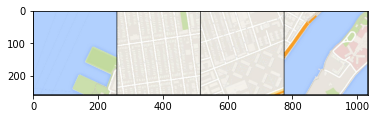

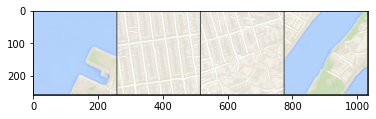

Epoch 16: Step 9200: Generator (U-Net) loss: 10.113167107105255, Discriminator loss: 0.3201598788052798


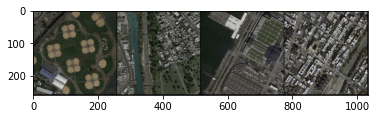

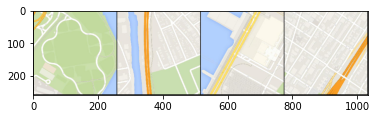

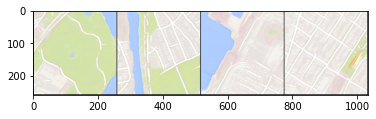

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 17: Step 9400: Generator (U-Net) loss: 10.198432633876802, Discriminator loss: 0.3231811164785176


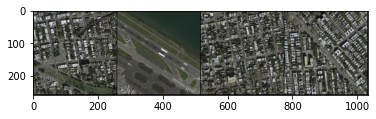

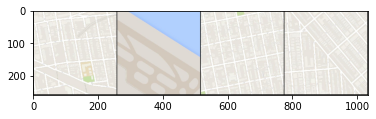

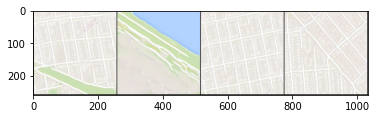

Epoch 17: Step 9600: Generator (U-Net) loss: 9.803431375026705, Discriminator loss: 0.36600661061704176


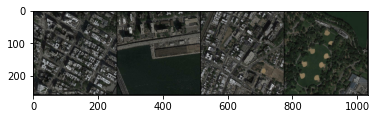

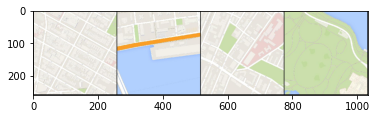

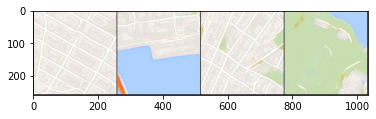

Epoch 17: Step 9800: Generator (U-Net) loss: 9.764770102500915, Discriminator loss: 0.3102240727841854


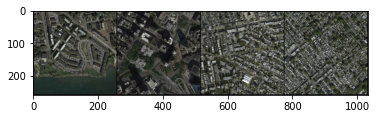

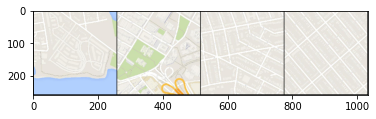

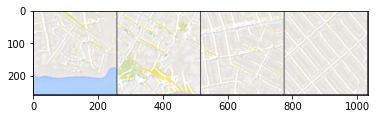

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 18: Step 10000: Generator (U-Net) loss: 9.826052448749541, Discriminator loss: 0.34887664648704225


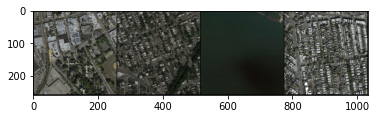

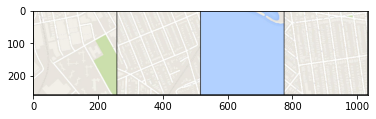

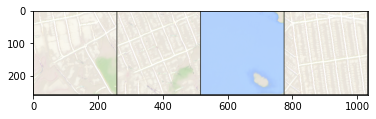

Epoch 18: Step 10200: Generator (U-Net) loss: 9.61605962514878, Discriminator loss: 0.3213076626323164


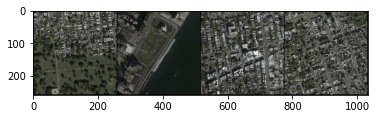

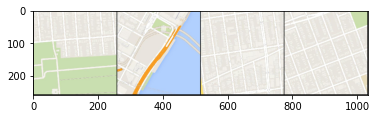

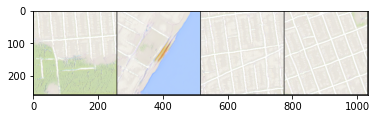

Epoch 18: Step 10400: Generator (U-Net) loss: 9.89568386316299, Discriminator loss: 0.33426874530501655


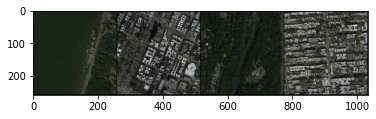

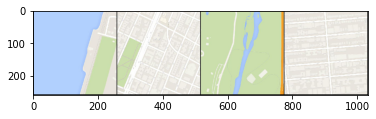

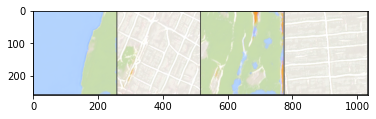

  0%|          | 0/549 [00:00<?, ?it/s]

Epoch 19: Step 10600: Generator (U-Net) loss: 9.836190378665925, Discriminator loss: 0.32797243481501936


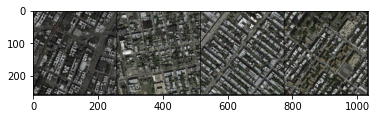

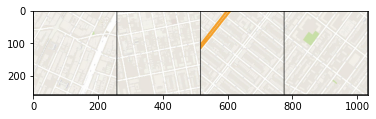

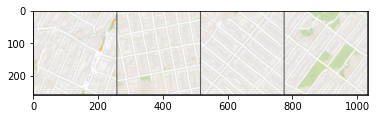

Epoch 19: Step 10800: Generator (U-Net) loss: 9.633123607635492, Discriminator loss: 0.39135046943090857


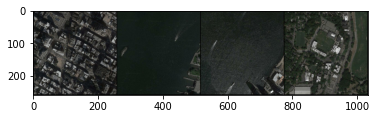

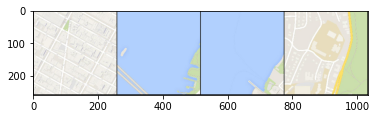

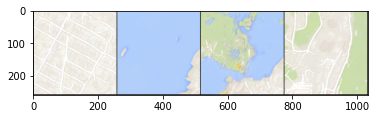

In [18]:
#from skimage import color
import numpy as np

def train(save_model=False):
    mean_generator_loss = 0
    mean_discriminator_loss = 0
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    cur_step = 0

    for epoch in range(n_epochs):
        # Dataloader devuelve los lotes
        for image, _ in tqdm(dataloader):
            image_width = image.shape[3]
            condition = image[:, :, :, :image_width // 2]
            condition = nn.functional.interpolate(condition, size=target_shape)
            real = image[:, :, :, image_width // 2:]
            real = nn.functional.interpolate(real, size=target_shape)
            cur_batch_size = len(condition)
            condition = condition.to(device)
            real = real.to(device)

            ### Actualizar el discriminador ###
            disc_opt.zero_grad() # Poner a cero el gradiente antes de la retropropagación
            with torch.no_grad():
                fake = gen(condition)
            disc_fake_hat = disc(fake.detach(), condition) # Separar generador
            disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
            disc_real_hat = disc(real, condition)
            disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
            disc_loss = (disc_fake_loss + disc_real_loss) / 2
            disc_loss.backward(retain_graph=True) # Actualizar gradicentes
            disc_opt.step() # Actualizar optimizador

            ### Actualizar generador ###
            gen_opt.zero_grad()
            gen_loss = get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon)
            gen_loss.backward() # Actualizar gradientes
            gen_opt.step() # Actualizar optimizadores

            # Realice un seguimiento de la pérdida promedio del discriminador
            mean_discriminator_loss += disc_loss.item() / display_step
            # Keep track of the average generator loss
            mean_generator_loss += gen_loss.item() / display_step

            ### Visualización del códifo ###
            if cur_step % display_step == 0:
                if cur_step > 0:
                    print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
                else:
                    print("Pretrained initial state")
                show_tensor_images(condition, size=(input_dim, target_shape, target_shape))
                show_tensor_images(real, size=(real_dim, target_shape, target_shape))
                show_tensor_images(fake, size=(real_dim, target_shape, target_shape))
                mean_generator_loss = 0
                mean_discriminator_loss = 0
                # Puede cambiar save_model a True si desea guardar el modelo
                if save_model:
                    torch.save({'gen': gen.state_dict(),
                        'gen_opt': gen_opt.state_dict(),
                        'disc': disc.state_dict(),
                        'disc_opt': disc_opt.state_dict()
                    }, f"pix2pix_{cur_step}.pth")
            cur_step += 1
train()
